In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import seaborn as sns

from oasis.functions import deconvolve
from scipy.stats import pearsonr
from scipy.linalg import logm

from utils.context_data_csv import ContextDataCSV
from utils.matrix_optimizer import MatrixOptimizer
import utils.sulfur.constant as const

/app/OASIS/oasis/functions.py:13: UserWarning: Could not find cvxpy. Don't worry, you can still use OASIS, just not the slower interior point methods we compared to in the papers.
  warn("Could not find cvxpy. Don't worry, you can still use OASIS, " +


In [2]:
engram_shock_cells = {
    'ID181106CreA': ['C261', 'C305', 'C347', 'C349', 'C351'],
    'ID181106CreB': ['C058', 'C089', 'C126'],
    'ID181106CreC': ['C017', 'C065', 'C112', 'C117', 'C203', 'C227'],
    'ID181106CreG': ['C127', 'C239', 'C323', 'C347', 'C350', 'C399', 'C402'],
    'ID181106CreH': ['C164', 'C180', 'C184', 'C243', 'C253', 'C298', 'C327', 'C351', 'C534', 'C542'],
    'ID181106CreI': ['C136', 'C197', 'C273', 'C292', 'C294', 'C306', 'C333'],
    'ID181106CreK': ['C083', 'C088', 'C100', 'C149', 'C390'],
    'ID181106CreL': ['C200'],
    'ID181106CreN': ['C199', 'C255', 'C258', 'C273'],
    'ID181106CreQ': ['C393']
}

non_engram_shock_cells = {
    'ID181106CreA': ['C000', 'C007', 'C009', 'C059', 'C076', 'C084', 'C086', 'C099', 'C101', 'C116', 'C120', 'C124', 'C141', 'C143', 'C145', 'C153', 'C164', 'C173', 'C175', 'C197', 'C198', 'C228', 'C234', 'C235', 'C284', 'C303', 'C306', 'C310', 'C317', 'C325', 'C327', 'C328', 'C336', 'C362', 'C377', 'C442', 'C459', 'C476', 'C479', 'C480', 'C487', 'C491', 'C493', 'C494', 'C519'],
    'ID181106CreB': ['C000', 'C003', 'C009', 'C010', 'C063', 'C066', 'C071', 'C072', 'C073', 'C080', 'C083', 'C088', 'C090', 'C094', 'C100', 'C103', 'C108', 'C109', 'C112', 'C114', 'C115', 'C127', 'C130', 'C131', 'C134', 'C166', 'C168', 'C169', 'C177', 'C178', 'C179', 'C200', 'C202', 'C203', 'C213', 'C230', 'C231', 'C268', 'C279', 'C282', 'C284'],
    'ID181106CreC': ['C002', 'C011', 'C012', 'C016', 'C019', 'C043', 'C045', 'C049', 'C050', 'C054', 'C055', 'C056', 'C058', 'C060', 'C063', 'C070', 'C072', 'C074', 'C076', 'C079', 'C084', 'C086', 'C088', 'C096', 'C105', 'C107', 'C118', 'C127', 'C132', 'C143', 'C144', 'C146', 'C153', 'C155', 'C160', 'C168', 'C186', 'C192', 'C193', 'C194', 'C198', 'C202', 'C205', 'C215', 'C219', 'C224', 'C233', 'C235', 'C237', 'C238', 'C239', 'C241', 'C256', 'C257', 'C262', 'C268', 'C272', 'C276', 'C287', 'C294', 'C295', 'C296'],
    'ID181106CreG': ['C003', 'C004', 'C005', 'C010', 'C011', 'C017', 'C025', 'C063', 'C067', 'C070', 'C071', 'C073', 'C076', 'C089', 'C102', 'C118', 'C126', 'C133', 'C136', 'C142', 'C157', 'C166', 'C177', 'C193', 'C197', 'C199', 'C204', 'C205', 'C210', 'C212', 'C229', 'C232', 'C244', 'C247', 'C249', 'C253', 'C261', 'C273', 'C286', 'C291', 'C293', 'C294', 'C298', 'C302', 'C304', 'C305', 'C309', 'C313', 'C325', 'C338', 'C344', 'C352', 'C353', 'C361', 'C377', 'C385', 'C426', 'C449', 'C458', 'C478'],
    'ID181106CreH': ['C018', 'C021', 'C059', 'C074', 'C081', 'C085', 'C087', 'C125', 'C127', 'C148', 'C160', 'C175', 'C203', 'C218', 'C232', 'C249', 'C252', 'C256', 'C261', 'C268', 'C271', 'C350', 'C361', 'C385', 'C386', 'C395', 'C397', 'C400', 'C404', 'C411', 'C475', 'C490', 'C493', 'C497', 'C498', 'C505', 'C511', 'C520', 'C521', 'C525', 'C529', 'C541', 'C579', 'C594', 'C603', 'C632', 'C636'],
    'ID181106CreI': ['C012', 'C049', 'C061', 'C143', 'C164', 'C166', 'C176', 'C183', 'C214', 'C249', 'C254', 'C256', 'C270', 'C275', 'C281', 'C302', 'C325', 'C326', 'C327', 'C341', 'C352', 'C368'],
    'ID181106CreK': ['C006', 'C045', 'C066', 'C071', 'C075', 'C080', 'C085', 'C102', 'C114', 'C117', 'C123', 'C124', 'C133', 'C136', 'C145', 'C178', 'C180', 'C202', 'C205', 'C206', 'C207', 'C208', 'C233', 'C238', 'C239', 'C243', 'C251', 'C262', 'C267', 'C277', 'C291', 'C297', 'C323', 'C325', 'C341', 'C352', 'C361', 'C376', 'C380', 'C399', 'C403', 'C411', 'C424', 'C428'],
    'ID181106CreL': ['C008', 'C015', 'C020', 'C021', 'C037', 'C040', 'C044', 'C049', 'C061', 'C069', 'C073', 'C074', 'C075', 'C082', 'C085', 'C123', 'C125', 'C126', 'C128', 'C129', 'C132', 'C133', 'C144', 'C150', 'C155', 'C162', 'C173', 'C180', 'C185', 'C196', 'C203', 'C209', 'C211', 'C213', 'C216', 'C224', 'C231', 'C236', 'C243', 'C255', 'C270', 'C273', 'C283', 'C298', 'C312', 'C315', 'C323', 'C332', 'C341', 'C343', 'C344', 'C346', 'C350', 'C353', 'C357', 'C373', 'C414', 'C416', 'C424', 'C439', 'C445', 'C456', 'C461', 'C463', 'C475', 'C498', 'C501'],
    'ID181106CreN': ['C008', 'C022', 'C028', 'C044', 'C048', 'C057', 'C062', 'C069', 'C079', 'C089', 'C098', 'C123', 'C144', 'C168', 'C186', 'C201', 'C204', 'C213', 'C217', 'C227', 'C228', 'C239', 'C261', 'C267', 'C288', 'C290', 'C301', 'C306', 'C309', 'C321', 'C343', 'C355', 'C391', 'C395', 'C397', 'C402', 'C404', 'C410', 'C412', 'C413', 'C416', 'C425', 'C429', 'C441', 'C463', 'C469', 'C490', 'C506', 'C511', 'C517'],
    'ID181106CreQ': ['C000', 'C001', 'C006', 'C009', 'C019', 'C022', 'C033', 'C034', 'C040', 'C042', 'C050', 'C055', 'C057', 'C059', 'C061', 'C070', 'C076', 'C089', 'C092', 'C098', 'C108', 'C118', 'C121', 'C122', 'C123', 'C127', 'C132', 'C134', 'C137', 'C168', 'C169', 'C173', 'C179', 'C181', 'C192', 'C202', 'C205', 'C207', 'C209', 'C214', 'C217', 'C239', 'C260', 'C263', 'C281', 'C284', 'C305', 'C308', 'C316', 'C325', 'C332', 'C333', 'C335', 'C336', 'C343', 'C347', 'C354', 'C362', 'C365', 'C368', 'C372', 'C374', 'C375', 'C380', 'C387', 'C398', 'C412', 'C417', 'C421', 'C426', 'C431', 'C434', 'C455', 'C456', 'C463', 'C464', 'C470', 'C485', 'C491']
}

In [3]:
all_shock_cells = {}
for animal_name in engram_shock_cells:
    all_shock_cells[animal_name] = engram_shock_cells[animal_name] + non_engram_shock_cells[animal_name]

In [4]:
def fetch_preserved_shock_values(shock_cell_name, preserved_shocks):
    if shock_cell_name in preserved_shocks:
        return preserved_shocks[shock_cell_name]
    
    return None

def estimate_spike(matrix, cell_name):
    spike_threshold = 0.05
    
    values = matrix.loc[:, cell_name]
    
    if values.isnull().all():
        return np.zeros(len(values))
    
    _c, spikes, _b, _g, _lam = deconvolve(values.to_numpy(), g=(None, None), penalty=1)
    spikes[spikes <= spike_threshold] = 0.0
    
    return spikes

def append_preserved_shock_values(shock_cell_name, preserved_shocks, spikes):
    if shock_cell_name in preserved_shocks:
        return
    
    preserved_shocks[shock_cell_name] = spikes
    
def is_all_zeros_constant_array(array):
    return np.all(array == 0.0)

def calc_cofiring_graph(matrix, shock_cells, preserved_spikes, start_frame, end_frame):
    spike_threshold = 0.05
    pearsonr_threshold = 0.1
    graph = nx.Graph()
    
    for i in range(len(shock_cells)):
        base_shock_cell = shock_cells[i]
        
        graph.add_node(base_shock_cell)
        
        base_spikes = fetch_preserved_shock_values(base_shock_cell, preserved_spikes)
        if base_spikes is None:
            base_spikes = estimate_spike(matrix, base_shock_cell)
            
        append_preserved_shock_values(base_shock_cell, preserved_spikes, base_spikes)
        
        base_spikes = base_spikes[start_frame:end_frame]
        if is_all_zeros_constant_array(base_spikes):
            continue
        
        for j in range(i + 1, len(shock_cells)):
            compared_shock_cell = shock_cells[j]
            
            compared_spikes = fetch_preserved_shock_values(compared_shock_cell, preserved_spikes)
            if compared_spikes is None:
                compared_spikes = estimate_spike(matrix, compared_shock_cell)
                
            append_preserved_shock_values(compared_shock_cell, preserved_spikes, compared_spikes)
            
            compared_spikes = compared_spikes[start_frame:end_frame]
            
            if is_all_zeros_constant_array(compared_spikes):
                continue

            r, _ = pearsonr(base_spikes, compared_spikes)
            if r >= pearsonr_threshold:
                graph.add_edge(base_shock_cell, compared_shock_cell, weight=r, length=1/r)
                
    return graph

def calc_maximum_distance(graph):
    lengths = nx.all_pairs_dijkstra_path_length(graph)
    
    length_values = []
    for _, value_dict in lengths:
        length_values += value_dict.values()
        
    return max(length_values)

animal name: ID181106CreA


/opt/conda/lib/python3.8/site-packages/scipy/linalg/_matfuncs_inv_ssq.py:827: LogmExactlySingularWarning: The logm input matrix is exactly singular.
  warnings.warn(exact_singularity_msg, LogmExactlySingularWarning)


           A1 shock#1 A1 shock#2 A1 shock#3 A4 shock#1 A4 shock#2 A4 shock#3
A1 shock#1        1.0   0.583818   0.947853   0.948731    0.94632   0.581966
A1 shock#2   0.603613        1.0   0.601658   0.600783    0.59991     0.9496
A1 shock#3   0.953207   0.597658        1.0   0.951114   0.953506   0.598691
A4 shock#1   0.947466   0.600488   0.946915        1.0   0.946856   0.600318
A4 shock#2   0.943051   0.591182   0.941381   0.949057        1.0   0.592589
A4 shock#3   0.593443   0.953939   0.593589    0.59349   0.592033        1.0
animal name: ID181106CreB


/opt/conda/lib/python3.8/site-packages/scipy/linalg/_matfuncs_inv_ssq.py:827: LogmExactlySingularWarning: The logm input matrix is exactly singular.
  warnings.warn(exact_singularity_msg, LogmExactlySingularWarning)


           A1 shock#1 A1 shock#2 A1 shock#3 A4 shock#1 A4 shock#2 A4 shock#3
A1 shock#1        1.0   0.591402   0.586236   0.583609   0.588115   0.582163
A1 shock#2   0.556281        1.0   0.946584   0.938476   0.936997   0.933984
A1 shock#3   0.569329   0.954207        1.0   0.942448   0.946145   0.948039
A4 shock#1   0.554137   0.934526   0.938887        1.0   0.940411   0.935354
A4 shock#2   0.560571   0.943192   0.945454   0.936947        1.0   0.935724
A4 shock#3   0.560369    0.94434   0.945385   0.949585   0.938939        1.0
animal name: ID181106CreC


/opt/conda/lib/python3.8/site-packages/scipy/linalg/_matfuncs_inv_ssq.py:827: LogmExactlySingularWarning: The logm input matrix is exactly singular.
  warnings.warn(exact_singularity_msg, LogmExactlySingularWarning)


           A1 shock#1 A1 shock#2 A1 shock#3 A4 shock#1 A4 shock#2 A4 shock#3
A1 shock#1        1.0    0.95789   0.959724   0.709287   0.708742   0.709591
A1 shock#2   0.959563        1.0   0.960082   0.689085   0.691725   0.689232
A1 shock#3   0.965837   0.967811        1.0   0.718065   0.719908   0.719253
A4 shock#1   0.735569   0.736707   0.734013        1.0   0.963414   0.964927
A4 shock#2   0.698466   0.702674   0.699019   0.964305        1.0   0.964815
A4 shock#3    0.69803    0.69739   0.696135   0.959664   0.962237        1.0
animal name: ID181106CreG


/opt/conda/lib/python3.8/site-packages/scipy/linalg/_matfuncs_inv_ssq.py:827: LogmExactlySingularWarning: The logm input matrix is exactly singular.
  warnings.warn(exact_singularity_msg, LogmExactlySingularWarning)


           A1 shock#1 A1 shock#2 A1 shock#3 A4 shock#1 A4 shock#2 A4 shock#3
A1 shock#1        1.0   0.964472   0.709248   0.960465   0.960157   0.714411
A1 shock#2   0.966684        1.0   0.702047   0.963707   0.962718   0.698784
A1 shock#3   0.708024   0.708263        1.0    0.70365   0.705394   0.584385
A4 shock#1   0.957803   0.964082   0.697492        1.0   0.957655   0.715141
A4 shock#2    0.95969    0.96001    0.70738   0.963428        1.0   0.719496
A4 shock#3   0.681147    0.68041   0.565773   0.683905   0.682112        1.0
animal name: ID181106CreH


/opt/conda/lib/python3.8/site-packages/scipy/linalg/_matfuncs_inv_ssq.py:827: LogmExactlySingularWarning: The logm input matrix is exactly singular.
  warnings.warn(exact_singularity_msg, LogmExactlySingularWarning)


           A1 shock#1 A1 shock#2 A1 shock#3 A4 shock#1 A4 shock#2 A4 shock#3
A1 shock#1        1.0    0.96283   0.958793    0.95245   0.957125   0.656894
A1 shock#2    0.95974        1.0   0.959974   0.952842   0.951177   0.651798
A1 shock#3   0.957467    0.95525        1.0   0.956874   0.951973   0.653948
A4 shock#1    0.95782   0.947175   0.956265        1.0   0.952834   0.639061
A4 shock#2   0.951916   0.953887   0.960757   0.953837        1.0   0.647831
A4 shock#3   0.645314   0.645339   0.643284    0.64836   0.640791        1.0
animal name: ID181106CreI
           A1 shock#1 A1 shock#2 A1 shock#3 A4 shock#1 A4 shock#2 A4 shock#3
A1 shock#1        1.0   0.894233   0.909205   0.907927   0.909198   0.892143
A1 shock#2   0.920033        1.0   0.925645   0.918637   0.925199   0.904867
A1 shock#3   0.915813   0.909075        1.0   0.920468   0.923868   0.927672
A4 shock#1   0.903305   0.911994   0.913909        1.0   0.913235   0.921522
A4 shock#2   0.901474   0.902493   0.912463   0.91

/opt/conda/lib/python3.8/site-packages/scipy/linalg/_matfuncs_inv_ssq.py:827: LogmExactlySingularWarning: The logm input matrix is exactly singular.
  warnings.warn(exact_singularity_msg, LogmExactlySingularWarning)


           A1 shock#1 A1 shock#2 A1 shock#3 A4 shock#1 A4 shock#2 A4 shock#3
A1 shock#1        1.0   0.970077   0.709837   0.966559   0.967254   0.714413
A1 shock#2   0.970196        1.0   0.712598   0.965385   0.966364   0.713771
A1 shock#3   0.709776   0.712521        1.0   0.711721   0.714216   0.603449
A4 shock#1   0.956729   0.958538   0.701937        1.0   0.953964   0.699097
A4 shock#2   0.965082   0.967974   0.710772   0.960328        1.0   0.710856
A4 shock#3    0.72485   0.722713   0.592521   0.721765   0.727666        1.0
animal name: ID181106CreN
           A1 shock#1 A1 shock#2 A1 shock#3 A4 shock#1 A4 shock#2 A4 shock#3
A1 shock#1        1.0   0.955729   0.955744   0.960261   0.953663   0.957665
A1 shock#2   0.958553        1.0   0.955087   0.951486   0.952371    0.95746
A1 shock#3   0.949852   0.950757        1.0   0.952714    0.95204   0.952135
A4 shock#1   0.952998   0.950077    0.95329        1.0    0.94725    0.95324
A4 shock#2   0.954759   0.950668   0.955087   0.95

/opt/conda/lib/python3.8/site-packages/scipy/linalg/_matfuncs_inv_ssq.py:827: LogmExactlySingularWarning: The logm input matrix is exactly singular.
  warnings.warn(exact_singularity_msg, LogmExactlySingularWarning)


           A1 shock#1 A1 shock#2 A1 shock#3 A4 shock#1 A4 shock#2 A4 shock#3
A1 shock#1        1.0   0.635982   0.754685    0.75405   0.638177    0.63975
A1 shock#2    0.65067        1.0    0.75809    0.75879   0.968088   0.965214
A1 shock#3   0.755549   0.745645        1.0   0.968785   0.748309   0.745842
A4 shock#1   0.764282   0.762401   0.970888        1.0   0.766363   0.765128
A4 shock#2   0.630681   0.970769   0.749245   0.749805        1.0   0.971426
A4 shock#3   0.658721   0.967093   0.760731   0.762071   0.973788        1.0


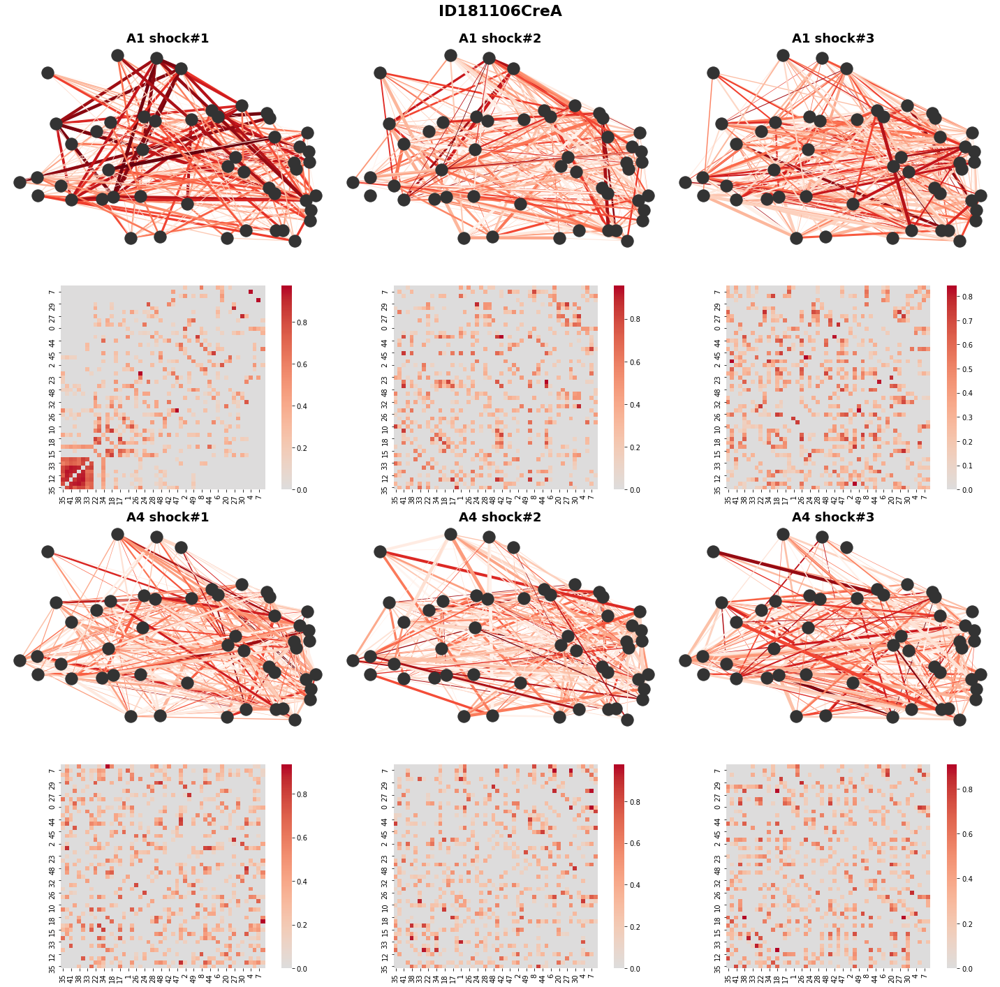

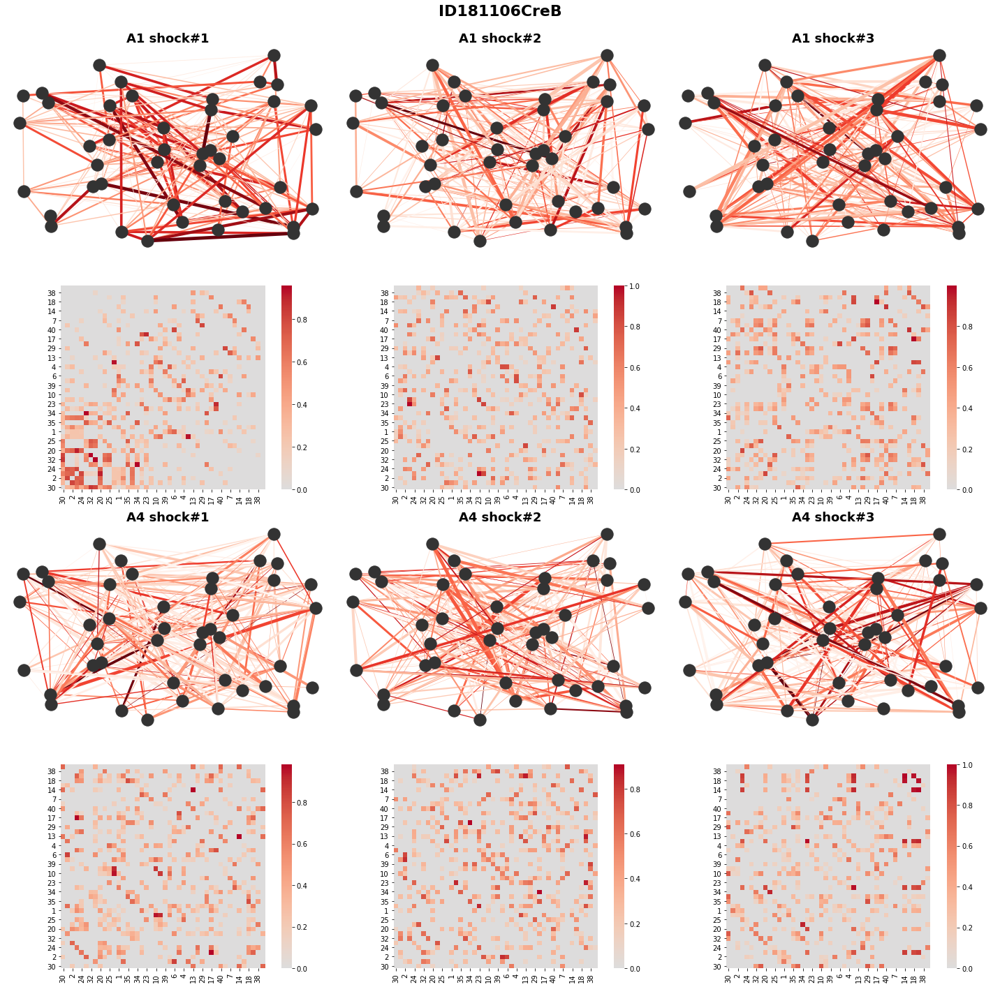

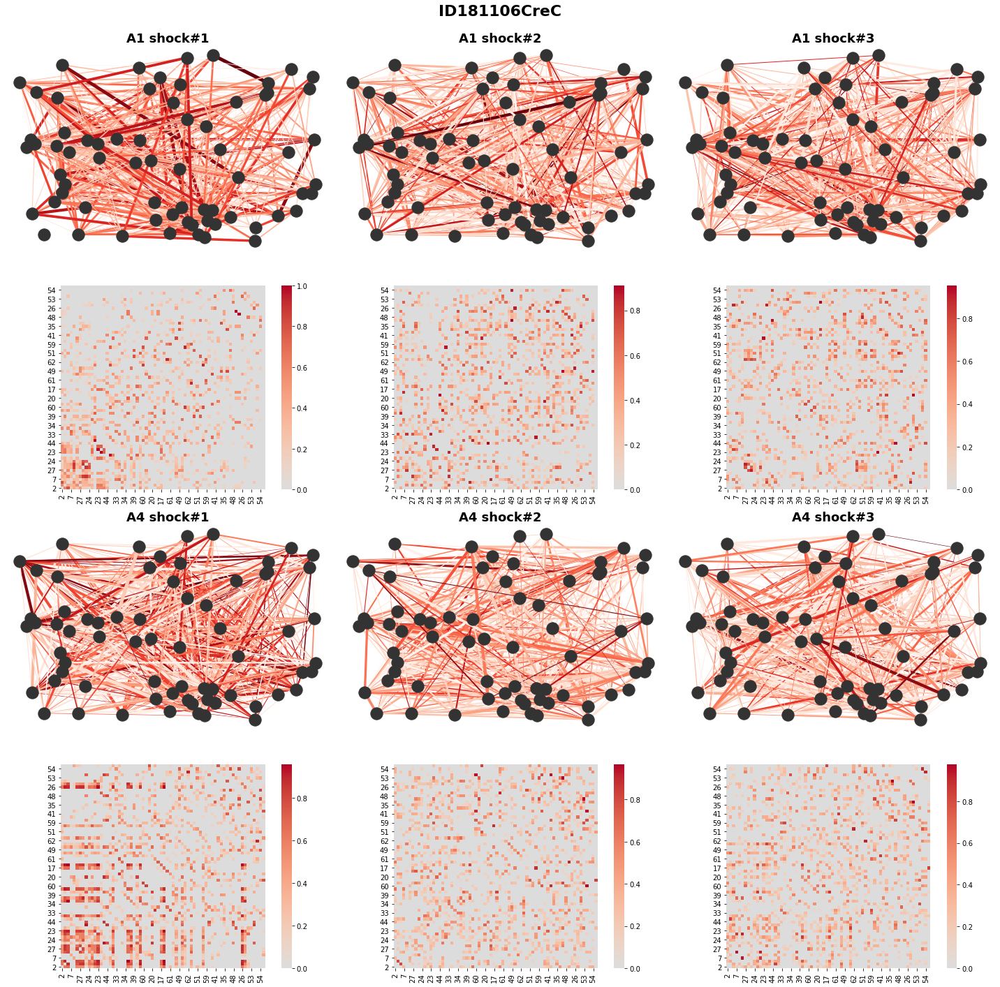

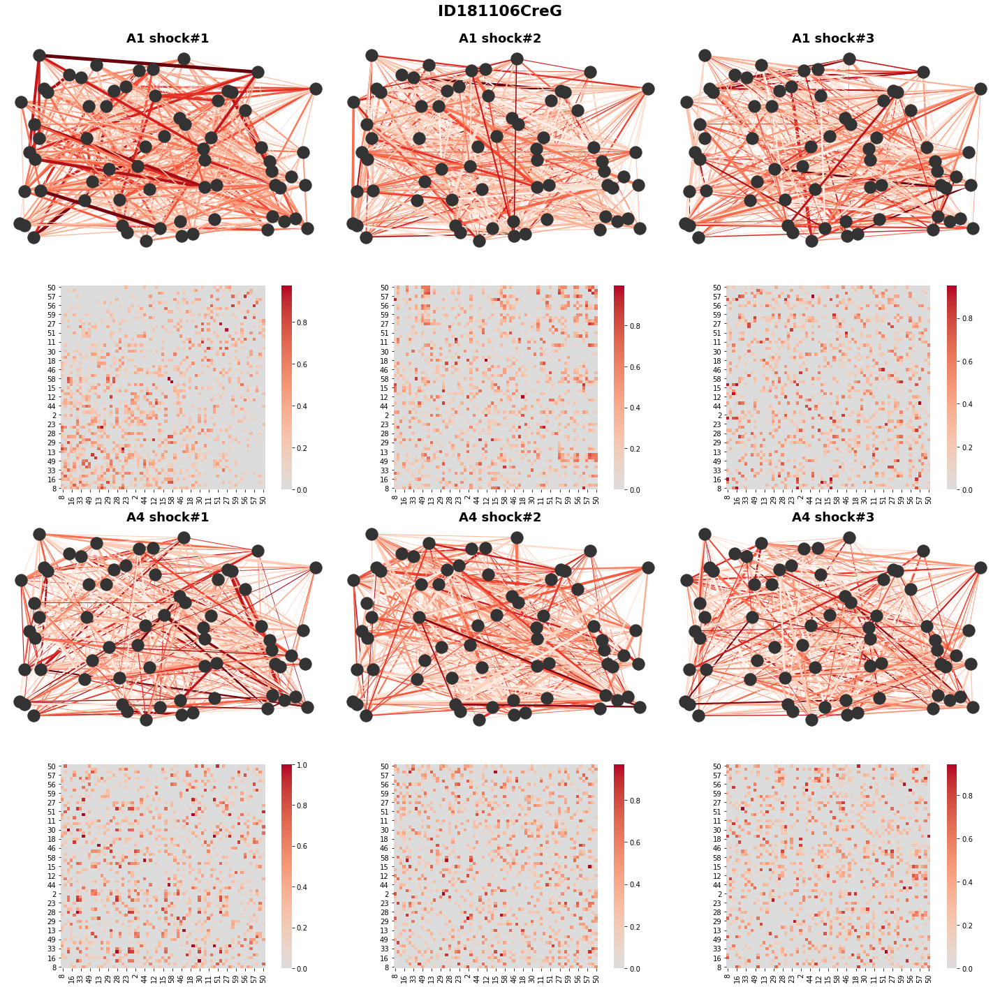

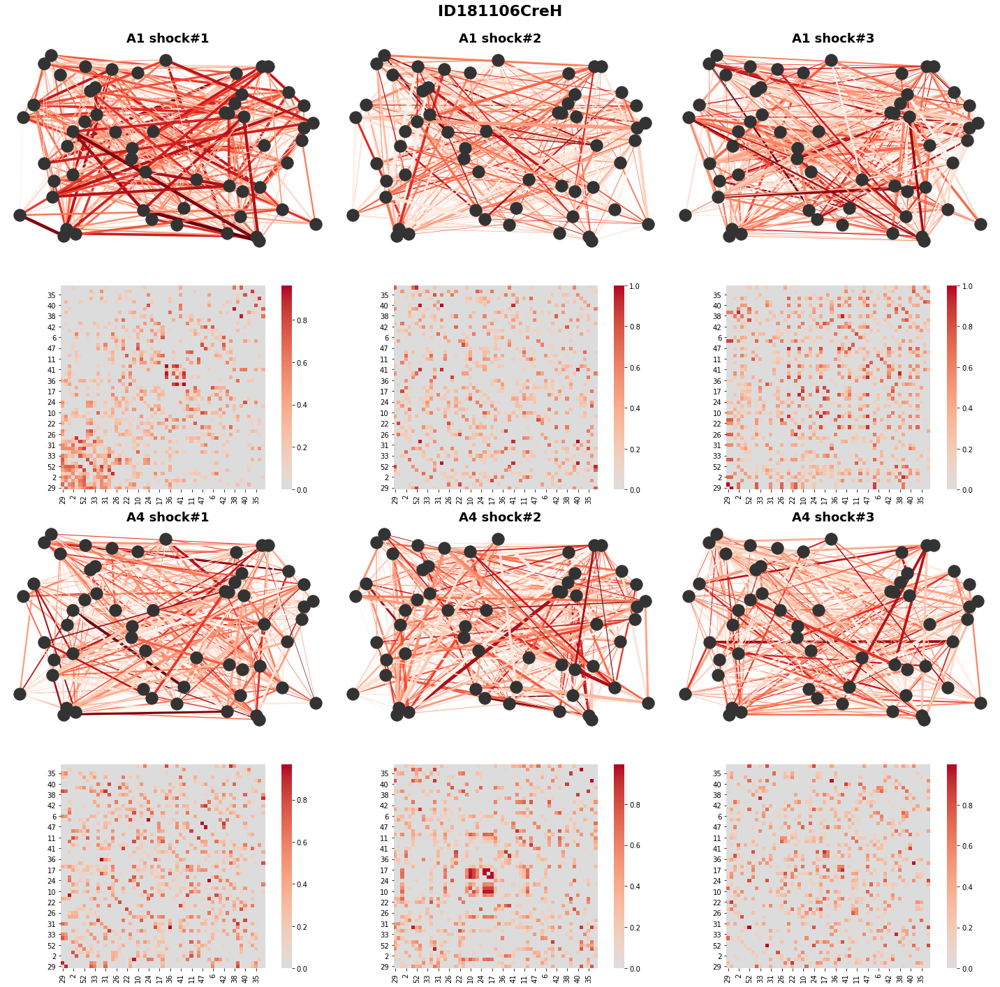

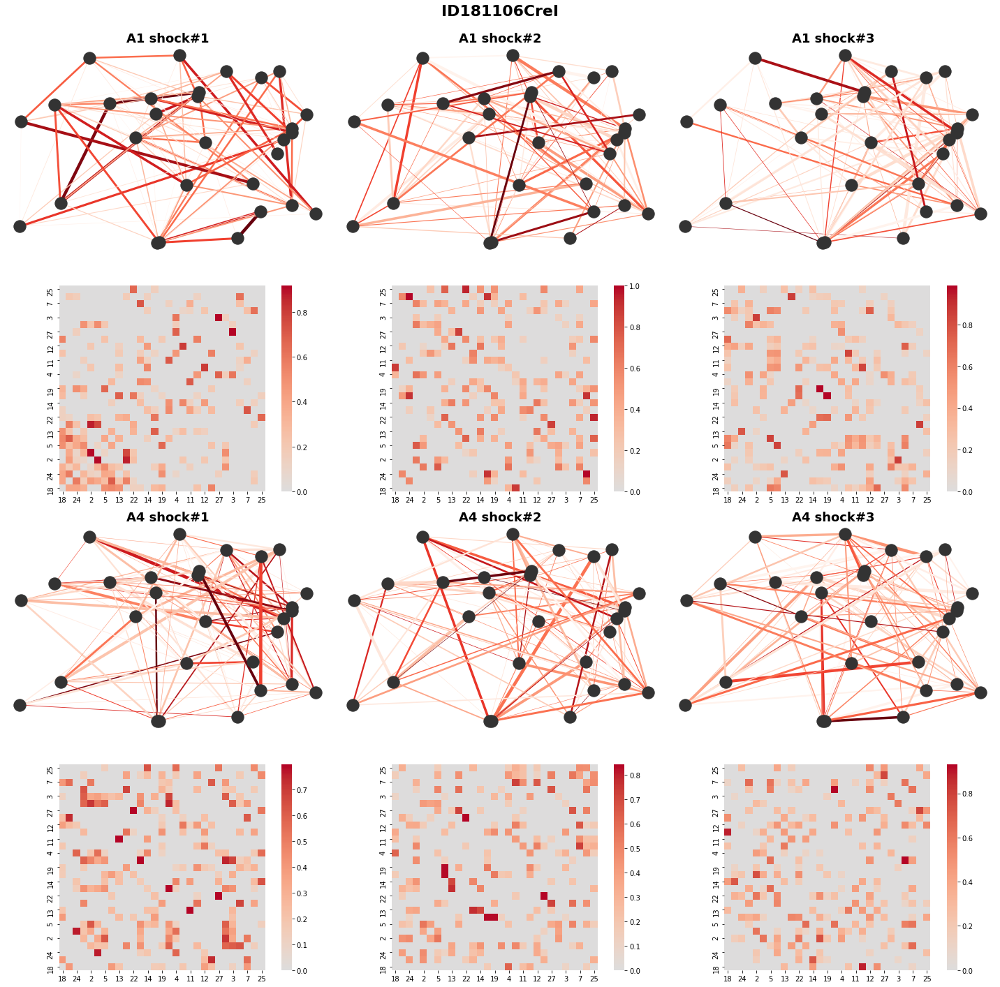

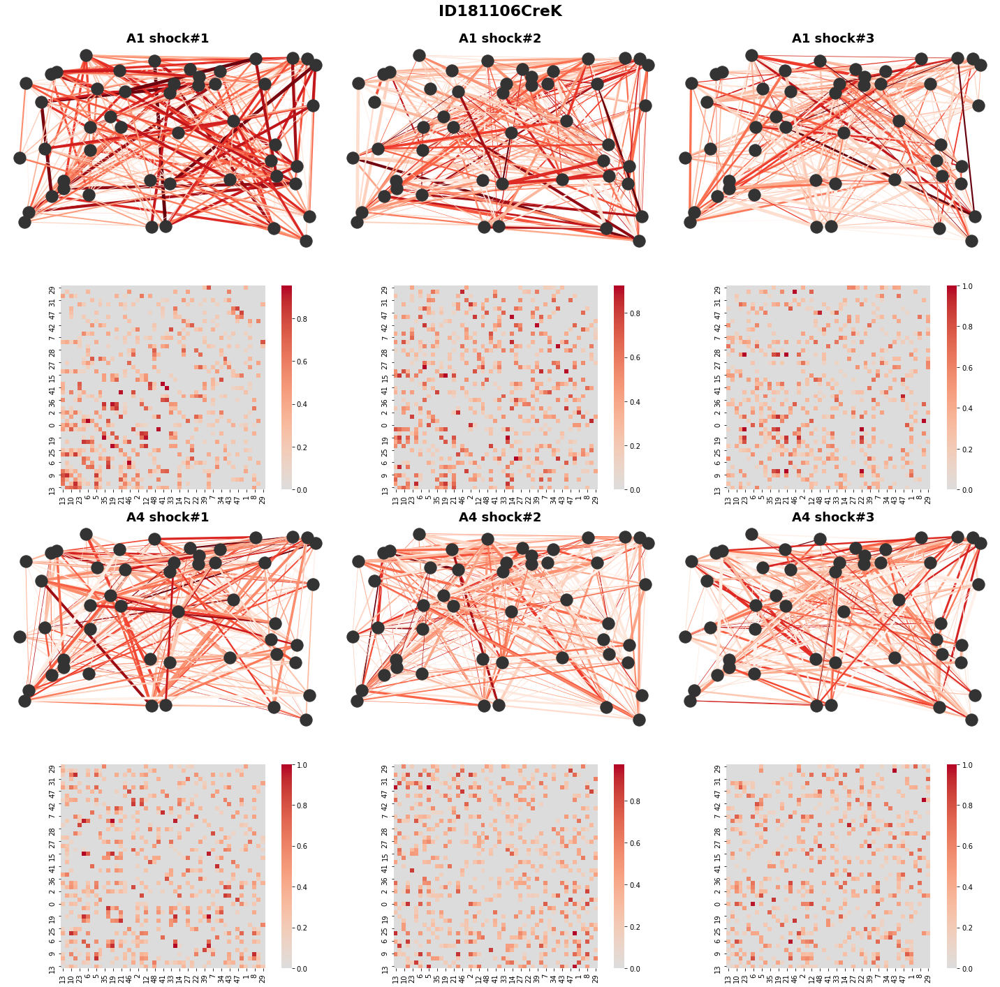

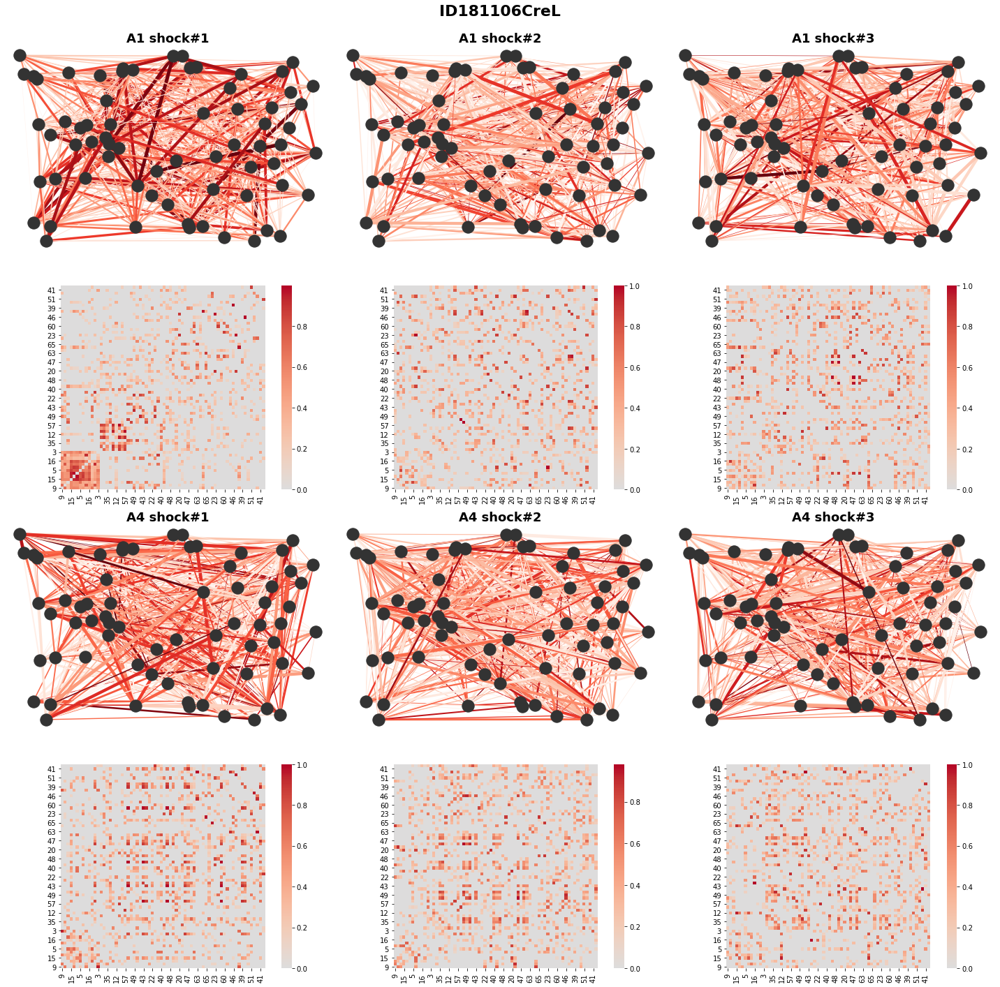

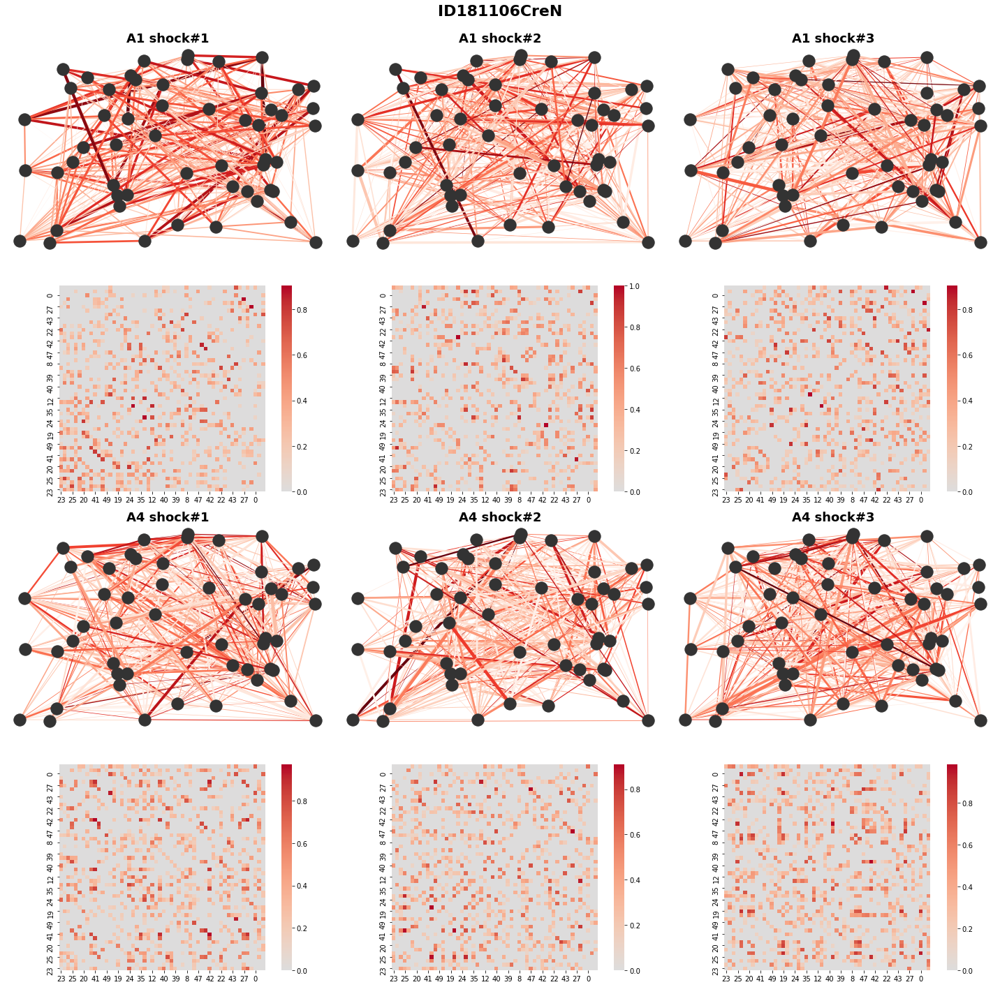

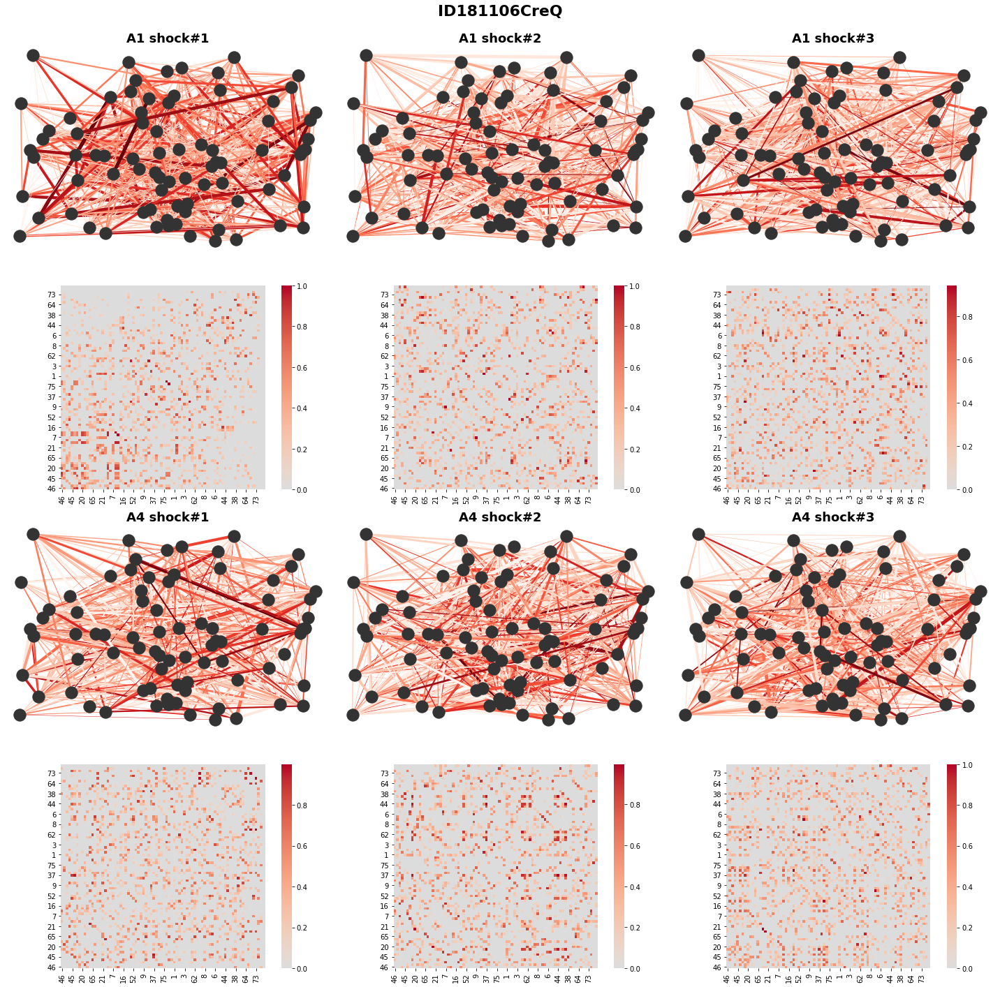

In [5]:
for animal_name in const.ANIMAL_NAMES:
    try:
        print('animal name: %s' % animal_name)
        
        shock_cells = all_shock_cells[animal_name]
        a1_csv = ContextDataCSV(animal_name, 'A1postES')
        a1_matrix = MatrixOptimizer(a1_csv.data_frame).divide_sd()
        a1_shock_matrix = a1_matrix.loc[:, shock_cells]
        
        max_distances = []
        
        a1_preserved_spikes = {}
        a1_1_graph = calc_cofiring_graph(a1_shock_matrix, shock_cells, a1_preserved_spikes, 80, 100)
        a1_2_graph = calc_cofiring_graph(a1_shock_matrix, shock_cells, a1_preserved_spikes, 980, 1000)
        a1_3_graph = calc_cofiring_graph(a1_shock_matrix, shock_cells, a1_preserved_spikes, 1880, 1900)
        
        max_distances.append(calc_maximum_distance(a1_1_graph))
        max_distances.append(calc_maximum_distance(a1_2_graph))
        max_distances.append(calc_maximum_distance(a1_3_graph))
        
        a4_csv = ContextDataCSV(animal_name, 'A4postES')
        a4_matrix = MatrixOptimizer(a4_csv.data_frame).divide_sd()
        a4_shock_matrix = a4_matrix.loc[:, shock_cells]
        
        a4_preserved_spikes = {}
        a4_1_graph = calc_cofiring_graph(a4_shock_matrix, shock_cells, a4_preserved_spikes, 80, 100)
        a4_2_graph = calc_cofiring_graph(a4_shock_matrix, shock_cells, a4_preserved_spikes, 980, 1000)
        a4_3_graph = calc_cofiring_graph(a4_shock_matrix, shock_cells, a4_preserved_spikes, 1880, 1900)
        
        max_distances.append(calc_maximum_distance(a4_1_graph))
        max_distances.append(calc_maximum_distance(a4_2_graph))
        max_distances.append(calc_maximum_distance(a4_3_graph))
        
        fig, axes = plt.subplots(ncols=3, nrows=4, figsize=(20, 20))
        
        pos = nx.random_layout(a1_1_graph)
        
        adjacency_matrixes = []
        
        a1_1_edges, a1_1_weights = zip(*nx.get_edge_attributes(a1_1_graph, 'weight').items())
        nx.draw(a1_1_graph, pos, node_color='0.2', edgelist=a1_1_edges, edge_color=a1_1_weights, width=(np.array(a1_1_weights) * 5), edge_cmap=plt.cm.Reds, ax=axes[0][0])
        axes[0][0].set_title('A1 shock#1', fontsize=18, fontweight='bold')
        
        a1_1_adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(a1_1_graph).toarray())
        adjacency_matrixes.append(a1_1_adjacency_matrix.copy(deep=True))
        ordered_high_weight_index = a1_1_adjacency_matrix.sum().sort_values(ascending=False).index
        a1_1_adjacency_matrix = a1_1_adjacency_matrix.reindex(index=ordered_high_weight_index, columns=ordered_high_weight_index, copy=True)
        
        ax = sns.heatmap(a1_1_adjacency_matrix, square=True, cmap='coolwarm', center=0.0, ax=axes[1][0])
        ax.invert_yaxis()
        
        a1_2_edges, a1_2_weights = zip(*nx.get_edge_attributes(a1_2_graph, 'weight').items())
        nx.draw(a1_2_graph, pos, node_color='0.2', edgelist=a1_2_edges, edge_color=a1_2_weights, width=(np.array(a1_1_weights) * 5), edge_cmap=plt.cm.Reds, ax=axes[0][1])
        axes[0][1].set_title('A1 shock#2', fontsize=18, fontweight='bold')
        
        a1_2_adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(a1_2_graph).toarray())
        adjacency_matrixes.append(a1_2_adjacency_matrix.copy(deep=True))
        a1_2_adjacency_matrix = a1_2_adjacency_matrix.reindex(index=ordered_high_weight_index, columns=ordered_high_weight_index, copy=True)
        
        ax = sns.heatmap(a1_2_adjacency_matrix, square=True, cmap='coolwarm', center=0.0, ax=axes[1][1])
        ax.invert_yaxis()
        
        a1_3_edges, a1_3_weights = zip(*nx.get_edge_attributes(a1_3_graph, 'weight').items())
        nx.draw(a1_3_graph, pos, node_color='0.2', edgelist=a1_3_edges, edge_color=a1_3_weights, width=(np.array(a1_1_weights) * 5), edge_cmap=plt.cm.Reds, ax=axes[0][2])
        axes[0][2].set_title('A1 shock#3', fontsize=18, fontweight='bold')
        
        a1_3_adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(a1_3_graph).toarray())
        adjacency_matrixes.append(a1_3_adjacency_matrix.copy(deep=True))
        a1_3_adjacency_matrix = a1_3_adjacency_matrix.reindex(index=ordered_high_weight_index, columns=ordered_high_weight_index, copy=True)
        
        ax = sns.heatmap(a1_3_adjacency_matrix, square=True, cmap='coolwarm', center=0.0, ax=axes[1][2])
        ax.invert_yaxis()
        
        a4_1_edges, a4_1_weights = zip(*nx.get_edge_attributes(a4_1_graph, 'weight').items())
        nx.draw(a4_1_graph, pos, node_color='0.2', edgelist=a4_1_edges, edge_color=a4_1_weights, width=(np.array(a1_1_weights) * 5), edge_cmap=plt.cm.Reds, ax=axes[2][0])
        axes[2][0].set_title('A4 shock#1', fontsize=18, fontweight='bold')
        
        a4_1_adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(a4_1_graph).toarray())
        adjacency_matrixes.append(a4_1_adjacency_matrix.copy(deep=True))
        a4_1_adjacency_matrix = a4_1_adjacency_matrix.reindex(index=ordered_high_weight_index, columns=ordered_high_weight_index, copy=True)
        
        ax = sns.heatmap(a4_1_adjacency_matrix, square=True, cmap='coolwarm', center=0.0, ax=axes[3][0])
        ax.invert_yaxis()
        
        a4_2_edges, a4_2_weights = zip(*nx.get_edge_attributes(a4_2_graph, 'weight').items())
        nx.draw(a4_2_graph, pos, node_color='0.2', edgelist=a4_2_edges, edge_color=a4_2_weights, width=(np.array(a1_1_weights) * 5), edge_cmap=plt.cm.Reds, ax=axes[2][1])
        axes[2][1].set_title('A4 shock#2', fontsize=18, fontweight='bold')
        
        a4_2_adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(a4_2_graph).toarray())
        adjacency_matrixes.append(a4_2_adjacency_matrix.copy(deep=True))
        a4_2_adjacency_matrix = a4_2_adjacency_matrix.reindex(index=ordered_high_weight_index, columns=ordered_high_weight_index, copy=True)
        
        ax = sns.heatmap(a4_2_adjacency_matrix, square=True, cmap='coolwarm', center=0.0, ax=axes[3][1])
        ax.invert_yaxis()
        
        a4_3_edges, a4_3_weights = zip(*nx.get_edge_attributes(a4_3_graph, 'weight').items())
        nx.draw(a4_3_graph, pos, node_color='0.2', edgelist=a4_3_edges, edge_color=a4_3_weights, width=(np.array(a1_1_weights) * 5), edge_cmap=plt.cm.Reds, ax=axes[2][2])
        axes[2][2].set_title('A4 shock#3', fontsize=18, fontweight='bold')
        
        a4_3_adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(a4_3_graph).toarray())
        adjacency_matrixes.append(a4_3_adjacency_matrix.copy(deep=True))
        a4_3_adjacency_matrix = a4_3_adjacency_matrix.reindex(index=ordered_high_weight_index, columns=ordered_high_weight_index, copy=True)
        ax = sns.heatmap(a4_3_adjacency_matrix, square=True, cmap='coolwarm', center=0.0, ax=axes[3][2])
        ax.invert_yaxis()
        
        topological_distance_df_index = ['A1 shock#1', 'A1 shock#2', 'A1 shock#3', 'A4 shock#1', 'A4 shock#2', 'A4 shock#3']
        topological_distance_df = pd.DataFrame(index=topological_distance_df_index, columns=topological_distance_df_index)
        
        for i, base_matrix in enumerate(adjacency_matrixes):
            base_n = len(base_matrix)
            white_noise = np.random.normal(0.0, 1.0, base_n ** 2).reshape(base_n, base_n)
            
            for j, compared_matrix in enumerate(adjacency_matrixes):
                compared_n = len(compared_matrix)
                
                #if topological_distance_df.iloc[j, i] is not np.nan:
                #    topological_distance_df.iloc[i, j] = topological_distance_df.iloc[j, i]
                #    continue
                
                distances = np.tril(logm(base_matrix) - logm(compared_matrix) + white_noise)
                distance = np.linalg.norm(distances)
                
                topological_distance_df.iloc[i, j] = 1.0 / distance
            max_value = topological_distance_df.iloc[i, :].max()
            topological_distance_df.iloc[i, :] /= max_value
                
        print(topological_distance_df)
        
        fig.tight_layout(rect=[0, 0, 1, 0.96])
        fig.suptitle(animal_name, fontsize=22, fontweight='bold')
        fig.show()
    except Exception as e:
        print(e)
        fig.clear()